# Experiment A-03 - Seed-Dependence

## **🔴 Context**

- All schemes until now were trained on the same seed (seed=2).
- Seed controls the randomness of perturbation during training and start month of training.
- Training is exactly the same (`output_form = PlanckOutput` and same to experiment A-02), except different seedings

---

## **🟡 Experiment Questions**

#### **Q1 - How does the seed affect scheme skill?**

Only slightly in absolute terms — but the spread is comparable to the gaps between output
forms in exp_A-02, so individual runs overlap with the nominally worse `DirectOutput`.
**exp_A-02's output-form ranking therefore lies partly within seed noise, so the evidence for PlanckOutput being the best output form is weaker than exp_A-02 suggested.**

#### **Q2 - How does the seed affect the learned mapping?**

Area-weighted median correlation of the day-1 error field over the three seed pairs:

- Temperature: 0.468
- olw:         0.599
- slwd:        0.792

Identically trained schemes reach the same skill while learning measurably different
mappings - most severely for temperature, where less than a quarter of the error pattern is shared.

---

## **🟢 Short Result**
#### Independently seeded schemes reach the same skill but learn different mappings, most severely for temperature. Therefore, experiment A-02's rankings are not resolvable.


---

## **0. Setup**

In [32]:
# Loading packages
using Revise
using NeuralParam
using CairoMakie
using Statistics

In [23]:
# Define experiment
EXP = "exp_A_03_seeding";

## **1. Training**

In [3]:
# Define notebook picture scaling
NB_TRAIN = (; size = (900, 600));

In [6]:
# Define schemes, labels, colors and plotting steps
SCHEMES = ["NLW_seed1", "NLW_seed2", "NLW_seed3"]
LABELS = ["Seed 1", "Seed 2", "Seed 3"]
COLORS = [JL_RED, JL_BLUE, JL_GREEN];
STEPS = 100:500;

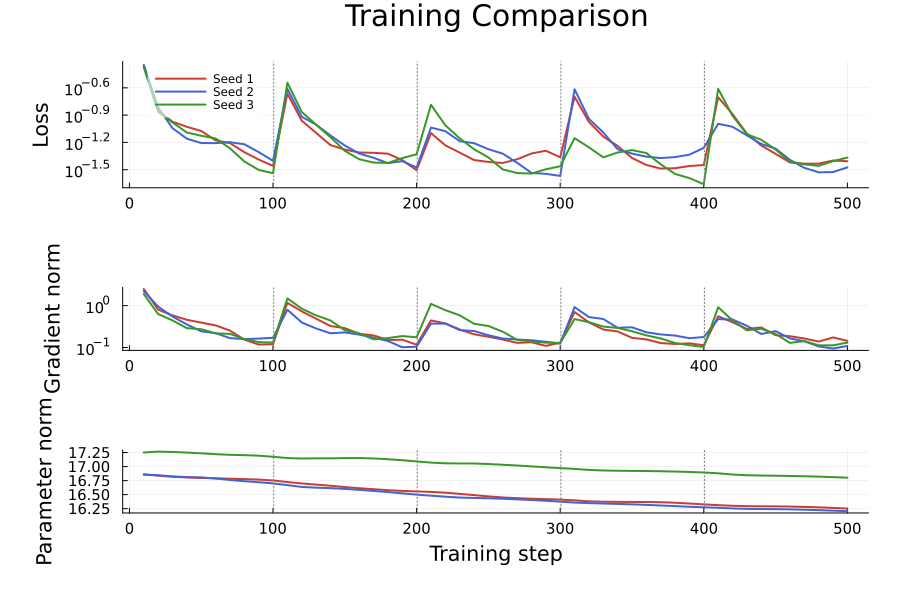

In [7]:
# Plot training comparison
plot_training_comp(; exp = EXP, names = SCHEMES, labels = LABELS, colors = COLORS, plot_kwargs = NB_TRAIN)

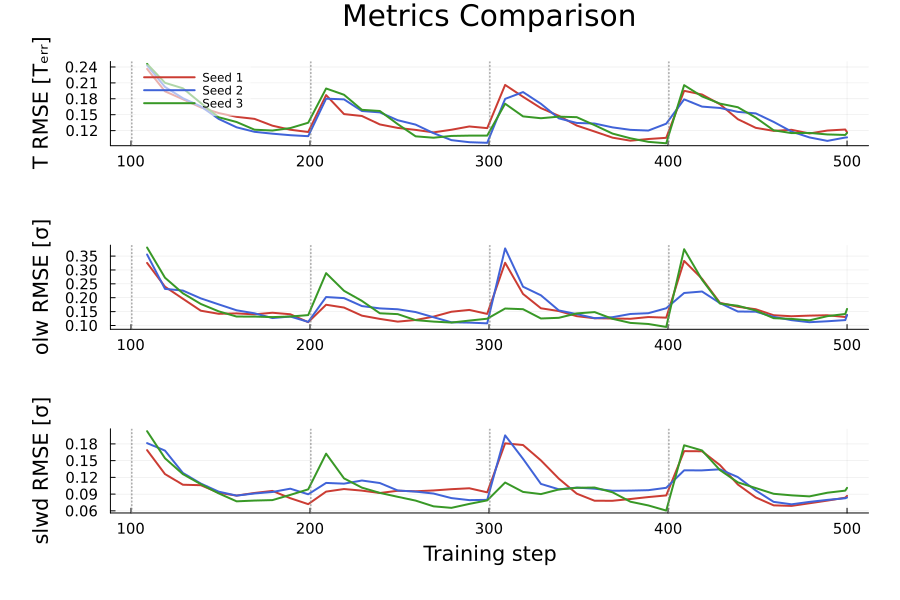

In [8]:
# Training metrics comparison
plot_metrics_comp(; exp = EXP, names = SCHEMES, labels = LABELS, colors = COLORS, steps = STEPS, plot_kwargs = NB_TRAIN)

## **2. Rollouts**

In [18]:
# Define notebook picture scaling
NB_ROLLOUT = (; size = (1200, 400));

In [ ]:
# Load for comparison NeuralLW scheme with direct output (significant performance difference to planck output)
EXP_DO = "exp_A_02_NLW_outputForms";
skill_DO = collect_rollouts(EXP_DO, ["NLW_direct_skill"]);

In [ ]:
# Define rollouts
SKILL_NAMES = [
    "OBLW_skill",
    "NLW_seed1_skill", 
    "NLW_seed2_skill", 
    "NLW_seed3_skill", 
]
STAB_NAMES = replace.(SKILL_NAMES, "skill" => "stab")

skill_SEED = collect_rollouts(EXP, SKILL_NAMES);

In [24]:
# Merge rollouts and define labels and colors
skill = merge(skill_DO, skill_SEED);

LABELS = ["NLW direct", "OBLW", "NLW Seed 1", "NLW Seed 2", "NLW Seed 3"];
COLORS = [:black, :grey, JL_RED, JL_RED, JL_RED];

### 2.1. Skill (31 days)

#### 2.1.1 Time Series

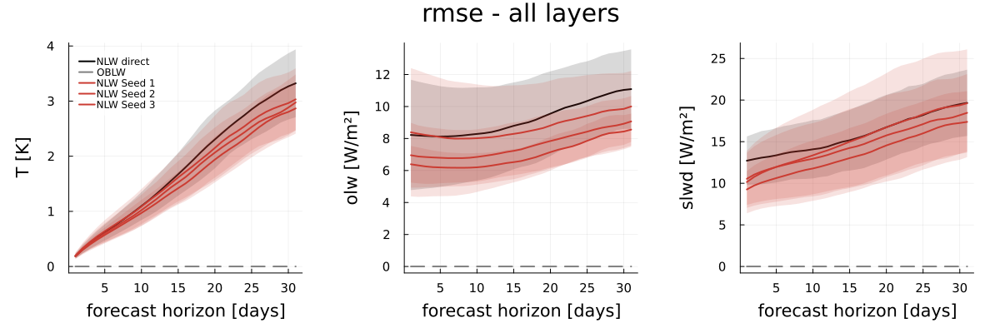

In [25]:
# Plot rmse comparison
plot_rollout(rollouts = skill, metric = :rmse, labels = LABELS, colors = COLORS, plot_kwargs = NB_ROLLOUT)

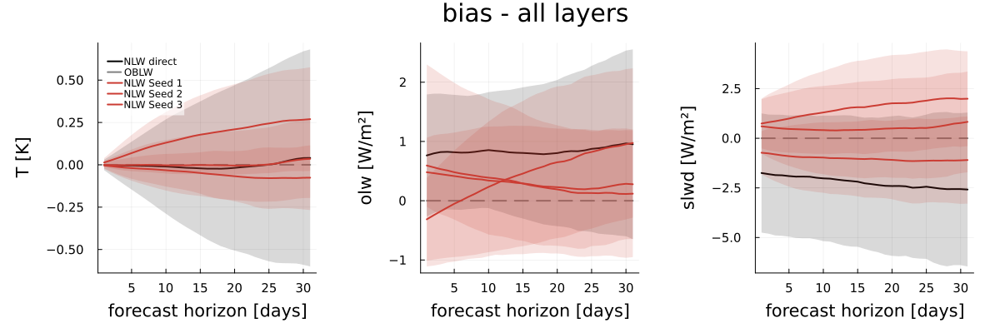

In [26]:
# Plot bias comparison
plot_rollout(rollouts = skill, metric = :bias, labels = LABELS, colors = COLORS, plot_kwargs = NB_ROLLOUT)

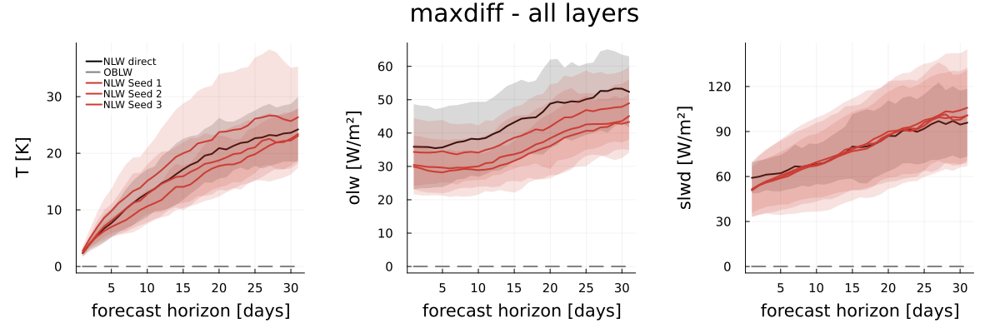

In [27]:
# Plot maxdiff comparison
plot_rollout(rollouts = skill, metric = :maxdiff, labels = LABELS, colors = COLORS, plot_kwargs = NB_ROLLOUT)

#### 2.1.2. Heatmaps

In [93]:
# Define notebook picture scaling
NB_HM = (; width = 400, height = 200, titlesize = 16, suptitlesize = 20);

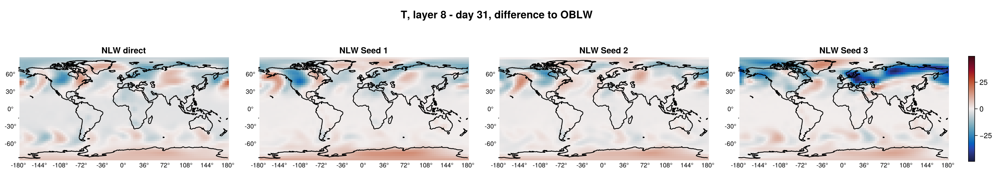

In [94]:
# Heatmap temperature surface layer
plot_rollout_heatmaps(; rollouts = skill, var = :T, ref = :OBLW_skill, layer = 8, labels = LABELS, layout = :horizontal, NB_HM...)[5]

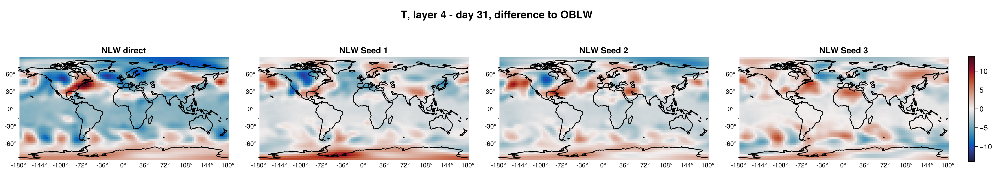

In [95]:
# Heatmap temperature mid layer
plot_rollout_heatmaps(; rollouts = skill, var = :T, ref = :OBLW_skill, layer = 4, labels = LABELS, layout = :horizontal, NB_HM...)[5]

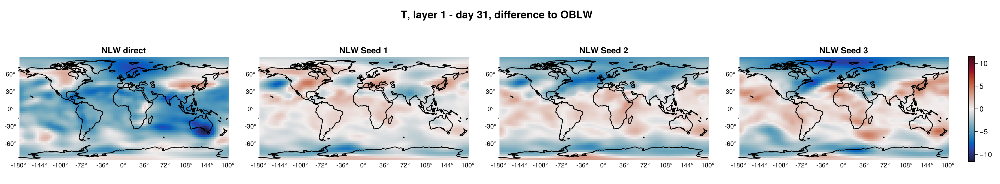

In [96]:
# Heatmap temperature upper layer
plot_rollout_heatmaps(; rollouts = skill, var = :T, ref = :OBLW_skill, layer = 1, labels = LABELS, layout = :horizontal, NB_HM...)[5]

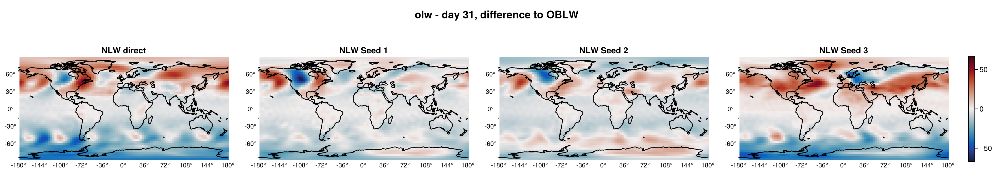

In [97]:
# Heatmap outgoing LW radiation
plot_rollout_heatmaps(; rollouts = skill, var = :olw, ref = :OBLW_skill, labels = LABELS, layout = :horizontal, NB_HM...)[5]

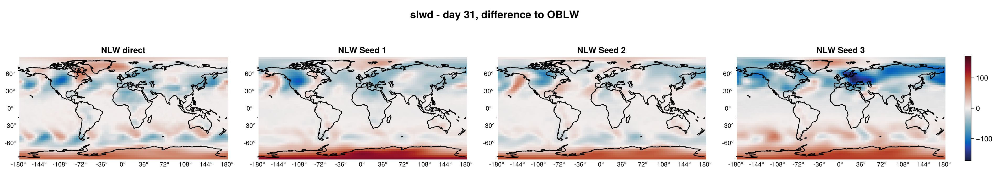

In [98]:
# Heatmap outgoing LW radiation
plot_rollout_heatmaps(; rollouts = skill, var = :slwd, ref = :OBLW_skill, labels = LABELS, layout = :horizontal, NB_HM...)[5]

#### 2.1.3 Correlation

In [34]:
# Variable correlation after 1 day
print_correlation(; rollouts = skill, day = 1, var = (:T, :olw, :slwd), labels = LABELS)

available days: [1, 3, 7, 14, 31]

T, layer mean - day 1                                                   olw, layer mean - day 1                                                 slwd, layer mean - day 1
              NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3                          NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3                          NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3
NLW direct           1.0       0.518       0.495       0.278            NLW direct           1.0       0.615       0.326       0.753            NLW direct           1.0       0.538       0.334       0.476
NLW Seed 1         0.518         1.0       0.468       0.519            NLW Seed 1         0.615         1.0       0.599       0.673            NLW Seed 1         0.538         1.0       0.817       0.792
NLW Seed 2         0.495       0.468         1.0       0.457            NLW Seed 2         0.326       0.599         1.0        0.35            NLW Seed 2         0.334       0.817 

In [30]:
# Variable correlation after 7 days
print_correlation(; rollouts = skill, day = 7, var = (:T, :olw, :slwd), labels = LABELS)

available days: [1, 3, 7, 14, 31]

T, layer mean - day 7                                                   olw, layer mean - day 7                                                 slwd, layer mean - day 7
              NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3                          NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3                          NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3
NLW direct           1.0       0.532       0.502       0.188            NLW direct           1.0       0.615       0.271       0.727            NLW direct           1.0        0.54       0.422       0.386
NLW Seed 1         0.532         1.0         0.5       0.517            NLW Seed 1         0.615         1.0       0.523       0.728            NLW Seed 1          0.54         1.0       0.788       0.748
NLW Seed 2         0.502         0.5         1.0        0.51            NLW Seed 2         0.271       0.523         1.0       0.352            NLW Seed 2         0.422       0.788 

In [31]:
# Variable correlation after 31 days
print_correlation(; rollouts = skill, day = 31, var = (:T, :olw, :slwd), labels = LABELS)

available days: [1, 3, 7, 14, 31]

T, layer mean - day 31                                                  olw, layer mean - day 31                                                slwd, layer mean - day 31
              NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3                          NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3                          NLW direct  NLW Seed 1  NLW Seed 2  NLW Seed 3
NLW direct           1.0       0.478       0.455       0.343            NLW direct           1.0       0.598       0.434       0.612            NLW direct           1.0       0.631       0.507       0.382
NLW Seed 1         0.478         1.0       0.528       0.339            NLW Seed 1         0.598         1.0       0.564       0.413            NLW Seed 1         0.631         1.0       0.667       0.639
NLW Seed 2         0.455       0.528         1.0       0.322            NLW Seed 2         0.434       0.564         1.0       0.321            NLW Seed 2         0.507       0.667

## **3. Benchmark**

In [35]:
# Define spectral grid for benchmark evaluation
using SpeedyWeather
SG = SpectralGrid(trunc = 31, nlayers = 8);

In [36]:
# Load schemes
schemes = merge(
    (; OBLW = build_scheme(:OBLW, SG)),
    collect_schemes(EXP, ["NLW_seed1", "NLW_seed2", "NLW_seed3"]),
);

In [37]:
# Evaluate and print bencnhmark results
res = benchmark_scheme(schemes; spectral_grid = SG)
print_benchmark(res; baseline = :OBLW);


scheme                    ms/step   med/min     KB/step      allocs    rel.
---------------------------------------------------------------------------
OBLW                       0.6482      1.01         0.0           0    1.0×
NLW_seed1                  8.8488      1.04      6187.5      101376  13.65×
NLW_seed2                  8.8384      1.11      6187.5      101376  13.64×
NLW_seed3                  8.8747      1.06      6187.5      101376  13.69×
